# Examen: Autoencoder Convolucional para Reducción de Ruido
## Dataset: Perros y Gatos | GPU: Tesla P100 | Kaggle
---

In [1]:
# ============================================================
# IMPORTACIONES Y CONFIGURACIÓN GLOBAL
# ============================================================
import os, glob, random, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers, callbacks
import tensorflow.keras.backend as K

# Semilla para reproducibilidad
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Habilitar eager execution
tf.config.run_functions_eagerly(True)
random.seed(SEED)

# Parámetros globales
IMG_SIZE     = 128
CHANNELS     = 3
BATCH_SIZE   = 64      # P100 tiene 16 GB VRAM → batch grande
EPOCHS       = 100
NOISE_FACTOR = 0.25    # Intensidad del ruido gaussiano

# Rutas del dataset (Kaggle)
TRAIN_PATH = "/kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TRAINING_SET"
TEST_PATH  = "/kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TEST_SET"
OUT_DIR    = "/kaggle/working"

# Verificar GPU
gpus = tf.config.list_physical_devices('GPU')
print(f"TensorFlow : {tf.__version__}")
print(f"GPUs disponibles: {gpus}")
print(f"Rutas de datos:")
print(f"  Train : {TRAIN_PATH}")
print(f"  Test  : {TEST_PATH}")
print(f"  Salida: {OUT_DIR}")

2026-05-27 15:31:20.509986: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779895880.725799      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779895880.791789      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1779895881.286996      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779895881.287043      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779895881.287046      58 computation_placer.cc:177] computation placer alr

TensorFlow : 2.19.0
GPUs disponibles: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Rutas de datos:
  Train : /kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TRAINING_SET
  Test  : /kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TEST_SET
  Salida: /kaggle/working


In [2]:
# ============================================================
# CELDA DE CARGA DE DATOS
# ============================================================

def load_images(folder, img_size=128, max_images=None):
    """
    Carga imágenes recursivamente desde una carpeta.
    - Redimensiona a img_size x img_size
    - Convierte BGR -> RGB
    - Retorna array float32 con valores en [0, 255]
    """
    paths = []
    for ext in ['*.jpg','*.jpeg','*.png','*.bmp','*.JPG','*.JPEG']:
        paths += glob.glob(os.path.join(folder, '**', ext), recursive=True)
        paths += glob.glob(os.path.join(folder, ext))
    paths = list(set(paths))
    random.shuffle(paths)
    if max_images:
        paths = paths[:max_images]

    images = []
    for p in paths:
        img = cv2.imread(p)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_AREA)
        images.append(img)

    print(f"  Cargadas {len(images)} imágenes de: {folder}")
    return np.array(images, dtype=np.float32)

print("Cargando imágenes de entrenamiento...")
imgs_train_raw = load_images(TRAIN_PATH, IMG_SIZE)

print("Cargando imágenes de prueba...")
imgs_test_raw  = load_images(TEST_PATH, IMG_SIZE)

# Unir todo para luego hacer el split completo
all_images = np.concatenate([imgs_train_raw, imgs_test_raw], axis=0)

print(f"\nTotal imágenes cargadas : {len(all_images)}")
print(f"Shape                   : {all_images.shape}")
print(f"Dtype                   : {all_images.dtype}")
print(f"Rango (antes normalizar): [{all_images.min():.0f}, {all_images.max():.0f}]")

Cargando imágenes de entrenamiento...
  Cargadas 8000 imágenes de: /kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TRAINING_SET
Cargando imágenes de prueba...
  Cargadas 2000 imágenes de: /kaggle/input/datasets/isaacguz/perros-gatos/PERROS_GATOS/TEST_SET

Total imágenes cargadas : 10000
Shape                   : (10000, 128, 128, 3)
Dtype                   : float32
Rango (antes normalizar): [0, 255]


In [3]:
# ============================================================
# CELDA DE CREACIÓN DE RUIDO
# ============================================================

def add_gaussian_noise(images, factor=0.25):
    """
    Ruido Gaussiano: agrega valores aleatorios N(0, factor) a cada píxel.
    Se hace clip para mantener el rango [0, 1].
    Parámetro 'factor' controla la intensidad (desviación estándar).
    """
    noise = np.random.normal(0.0, factor, images.shape).astype(np.float32)
    return np.clip(images + noise, 0.0, 1.0)

def add_salt_and_pepper(images, amount=0.05):
    """
    Ruido Sal y Pimienta: reemplaza una proporción 'amount' de píxeles
    con valores extremos (0.0 = pimienta, 1.0 = sal).
    Simula fallos de sensor o transmisión.
    """
    noisy = images.copy()
    n, h, w, c = images.shape
    total = h * w * c
    n_salt    = int(total * amount / 2)
    n_pepper  = int(total * amount / 2)
    for i in range(n):
        flat = noisy[i].reshape(-1)
        idx_s = np.random.choice(len(flat), n_salt,   replace=False)
        idx_p = np.random.choice(len(flat), n_pepper, replace=False)
        flat[idx_s] = 1.0
        flat[idx_p] = 0.0
        noisy[i] = flat.reshape(h, w, c)
    return noisy

print("Funciones de ruido definidas:")
print("  ✓ add_gaussian_noise   (distribución normal, factor=0.25)")
print("  ✓ add_salt_and_pepper  (píxeles extremos, amount=0.05)")

Funciones de ruido definidas:
  ✓ add_gaussian_noise   (distribución normal, factor=0.25)
  ✓ add_salt_and_pepper  (píxeles extremos, amount=0.05)


In [4]:
# ============================================================
# CELDA DE DIVISIÓN Y PREPROCESAMIENTO
# ============================================================

# Normalizar a [0, 1]
images_clean = all_images / 255.0
print(f"Rango normalizado: [{images_clean.min():.3f}, {images_clean.max():.3f}]")

# División estratificada: 70% Train | 15% Val | 15% Test
X_temp, X_test  = train_test_split(images_clean, test_size=0.15,          random_state=SEED)
X_train, X_val  = train_test_split(X_temp,       test_size=(0.15/0.85),   random_state=SEED)

print(f"\nDivisión del dataset ({len(images_clean)} imágenes totales):")
print(f"  Entrenamiento : {len(X_train):>5}  ({len(X_train)/len(images_clean)*100:.1f}%)")
print(f"  Validación    : {len(X_val):>5}  ({len(X_val)/len(images_clean)*100:.1f}%)")
print(f"  Prueba        : {len(X_test):>5}  ({len(X_test)/len(images_clean)*100:.1f}%)")

# Aplicar ruido gaussiano (tipo principal para entrenamiento)
print("\nGenerando versiones ruidosas...")
X_train_noisy = add_gaussian_noise(X_train, factor=NOISE_FACTOR)
X_val_noisy   = add_gaussian_noise(X_val,   factor=NOISE_FACTOR)
X_test_noisy  = add_gaussian_noise(X_test,  factor=NOISE_FACTOR)

# Ruido sal y pimienta solo para visualización comparativa
X_test_sp     = add_salt_and_pepper(X_test, amount=0.05)

print("  ✓ Ruido gaussiano aplicado a train / val / test")
print("  ✓ Ruido sal y pimienta aplicado a test (visualización)")
print(f"\nShape datos de entrenamiento: {X_train_noisy.shape}")

Rango normalizado: [0.000, 1.000]

División del dataset (10000 imágenes totales):
  Entrenamiento :  7000  (70.0%)
  Validación    :  1500  (15.0%)
  Prueba        :  1500  (15.0%)

Generando versiones ruidosas...
  ✓ Ruido gaussiano aplicado a train / val / test
  ✓ Ruido sal y pimienta aplicado a test (visualización)

Shape datos de entrenamiento: (7000, 128, 128, 3)


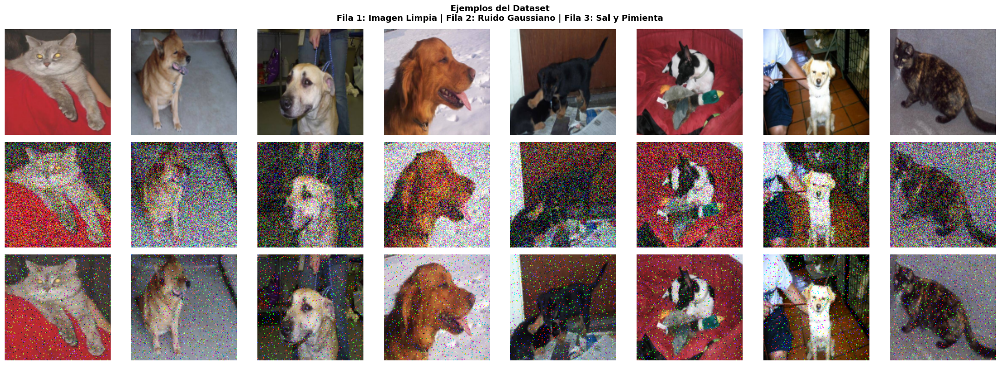

Guardado: 01_ejemplos_ruido.png


In [5]:
# ============================================================
# CELDA CON EJEMPLOS VISUALES
# (Original limpia | Ruido Gaussiano | Ruido Sal y Pimienta)
# ============================================================

n_show = 8
idx    = np.random.choice(len(X_test), n_show, replace=False)

fig, axes = plt.subplots(3, n_show, figsize=(22, 8))
fig.suptitle('Ejemplos del Dataset\n'             'Fila 1: Imagen Limpia | Fila 2: Ruido Gaussiano | Fila 3: Sal y Pimienta',
             fontsize=13, fontweight='bold')

row_labels = ['Limpia', 'Gaussiano', 'Sal y Pimienta']
row_data   = [X_test, X_test_noisy, X_test_sp]

for row, (label, data) in enumerate(zip(row_labels, row_data)):
    for col, i in enumerate(idx):
        axes[row, col].imshow(data[i])
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(label, fontsize=10, fontweight='bold', rotation=90)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/01_ejemplos_ruido.png", dpi=100, bbox_inches='tight')
plt.show()
print("Guardado: 01_ejemplos_ruido.png")

---
# PARTE 2: Construcción del Autoencoder (25 puntos)

| Modelo | Descripción |
|--------|-------------|
| **Modelo 1** | Autoencoder Ligero — 3 bloques, L2 |
| **Modelo 2** | Autoencoder Profundo — 5 bloques, BatchNorm + Dropout, L2 |
| **Modelo 3** | U-Net con Skip Connections — preserva detalles finos, L2 |

In [6]:
# ============================================================
# CELDA DE COMPILACIÓN: MÉTRICAS Y FUNCIÓN DE PÉRDIDA
# ============================================================

# Las métricas se definen como subclases de keras.metrics.Metric
# para compatibilidad con Keras 3 / TF2 en modo grafo (sin eager problems).

class PSNRMetric(tf.keras.metrics.Mean):
    """
    PSNR (Peak Signal-to-Noise Ratio) en dB.
    Fórmula: 10 * log10(1.0 / MSE)  (para imágenes normalizadas en [0,1])
    Valores típicos: >30 dB = buena calidad | >40 dB = excelente.
    Se hereda de keras.metrics.Mean para acumular correctamente por batch.
    """
    def __init__(self, name='psnr_metric', **kwargs):
        super().__init__(name=name, **kwargs)

    def update_state(self, y_true, y_pred, sample_weight=None):
        mse  = tf.reduce_mean(tf.square(y_true - y_pred))
        psnr = 10.0 * tf.math.log(1.0 / (mse + tf.keras.backend.epsilon())) / tf.math.log(10.0)
        super().update_state(psnr, sample_weight=sample_weight)


class MAEMetric(tf.keras.metrics.Mean):
    """
    MAE (Mean Absolute Error). Menos sensible a outliers que MSE.
    También hereda de keras.metrics.Mean para acumulación por batch.
    """
    def __init__(self, name='mae_metric', **kwargs):
        super().__init__(name=name, **kwargs)

    def update_state(self, y_true, y_pred, sample_weight=None):
        mae = tf.reduce_mean(tf.abs(y_true - y_pred))
        super().update_state(mae, sample_weight=sample_weight)


# Parámetros de compilación comunes a los tres modelos
COMPILE_PARAMS = dict(
    optimizer = keras.optimizers.Adam(learning_rate=1e-3),
    loss      = 'mse',                              # Mean Squared Error
    metrics   = [MAEMetric(), PSNRMetric()]          # MAE y PSNR
)

print("Métricas y compilación configuradas:")
print("  Pérdida    : MSE (Mean Squared Error)")
print("  Optimizador: Adam (lr=1e-3)")
print("  Métricas   : MAEMetric, PSNRMetric")


Métricas y compilación configuradas:
  Pérdida    : MSE (Mean Squared Error)
  Optimizador: Adam (lr=1e-3)
  Métricas   : MAEMetric, PSNRMetric


I0000 00:00:1779896002.391904      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [7]:
# ============================================================
# BLOQUE MODELO 1: AUTOENCODER LIGERO (modelo_1)
# ============================================================
# Decisiones de diseño:
#   - 3 bloques encoder (32→64→128 filtros) + 3 decoder (128→64→32)
#   - MaxPooling2D para reducción espacial progresiva (128→64→32→16)
#   - UpSampling2D para reconstrucción (16→32→64→128)
#   - L2 regularización (λ=1e-4) en todas las Conv para penalizar pesos grandes
#   - Activación Sigmoid en la salida → valores en [0,1]
#   - Sin BatchNorm: modelo base simple y rápido de entrenar
# Justificación: sirve como baseline. Pocos parámetros → rápido y
#   generaliza bien en datasets pequeños, pero puede sufrir underfitting.
# ============================================================

def build_modelo_1(input_shape=(128,128,3), l2=1e-4):
    R   = regularizers.l2(l2)
    inp = layers.Input(shape=input_shape)

    # ── ENCODER ──
    x = layers.Conv2D(32,  (3,3), activation='relu', padding='same', kernel_regularizer=R)(inp)
    x = layers.MaxPooling2D((2,2), padding='same')(x)   # 128→64

    x = layers.Conv2D(64,  (3,3), activation='relu', padding='same', kernel_regularizer=R)(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)   # 64→32

    x = layers.Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=R)(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)   # 32→16  (bottleneck)

    # ── DECODER ──
    x = layers.UpSampling2D((2,2))(x)                   # 16→32
    x = layers.Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=R)(x)

    x = layers.UpSampling2D((2,2))(x)                   # 32→64
    x = layers.Conv2D(64,  (3,3), activation='relu', padding='same', kernel_regularizer=R)(x)

    x = layers.UpSampling2D((2,2))(x)                   # 64→128
    x = layers.Conv2D(32,  (3,3), activation='relu', padding='same', kernel_regularizer=R)(x)

    out = layers.Conv2D(3, (3,3), activation='sigmoid', padding='same')(x)

    return models.Model(inp, out, name='modelo_1_ligero')

modelo_1 = build_modelo_1(input_shape=(IMG_SIZE, IMG_SIZE, CHANNELS))
modelo_1.compile(**COMPILE_PARAMS)
modelo_1.summary()
print(f"\nParámetros totales: {modelo_1.count_params():,}")

Model: "modelo_1_ligero"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,955 (1.27 MB)

 Trainable params: 333,955 (1.27 MB)

 Non-trainable params: 0 (0.00 B)


Parámetros totales: 333,955


In [8]:
# ============================================================
# BLOQUE MODELO 2: AUTOENCODER PROFUNDO + BATCHNORM (modelo_2)
# ============================================================
# Decisiones de diseño:
#   - 5 bloques encoder (32→64→128→256→512) + 5 decoder (512→256→128→64→32)
#   - BatchNormalization después de cada Conv:
#       * Normaliza activaciones → gradientes más estables
#       * Permite tasas de aprendizaje más altas
#       * Acelera convergencia significativamente
#   - Dropout(0.3) en el bottleneck:
#       * Regularización estocástica adicional
#       * Fuerza al modelo a aprender representaciones redundantes y robustas
#   - L2 en todas las capas convolucionales
# Justificación: más profundo = captura patrones más complejos (texturas,
#   formas globales). BN+Dropout controlan el sobreajuste. Mejor que M1
#   en datasets medianos/grandes.
# ============================================================

def build_modelo_2(input_shape=(128,128,3), l2=1e-4, drop=0.3):
    R   = regularizers.l2(l2)
    inp = layers.Input(shape=input_shape)

    def enc_block(x, f):
        x = layers.Conv2D(f, (3,3), padding='same', kernel_regularizer=R)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.MaxPooling2D((2,2), padding='same')(x)
        return x

    def dec_block(x, f):
        x = layers.UpSampling2D((2,2))(x)
        x = layers.Conv2D(f, (3,3), padding='same', kernel_regularizer=R)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        return x

    # ── ENCODER ──
    x = enc_block(inp, 32)    # 128→64
    x = enc_block(x,   64)    # 64→32
    x = enc_block(x,   128)   # 32→16
    x = enc_block(x,   256)   # 16→8

    # ── BOTTLENECK ──
    x = layers.Conv2D(512, (3,3), padding='same', kernel_regularizer=R)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2,2), padding='same')(x)  # 8→4
    x = layers.Dropout(drop)(x)

    # ── DECODER ──
    x = dec_block(x,  512)    # 4→8
    x = dec_block(x,  256)    # 8→16
    x = dec_block(x,  128)    # 16→32
    x = dec_block(x,   64)    # 32→64
    x = dec_block(x,   32)    # 64→128

    out = layers.Conv2D(3, (3,3), activation='sigmoid', padding='same')(x)

    return models.Model(inp, out, name='modelo_2_profundo')

modelo_2 = build_modelo_2(input_shape=(IMG_SIZE, IMG_SIZE, CHANNELS))
modelo_2.compile(**COMPILE_PARAMS)
modelo_2.summary()
print(f"\nParámetros totales: {modelo_2.count_params():,}")

Model: "modelo_2_profundo"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 8, 8, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,504,387 (21.00 MB)

 Trainable params: 5,500,419 (20.98 MB)

 Non-trainable params: 3,968 (15.50 KB)


Parámetros totales: 5,504,387


In [9]:
# ============================================================
# BLOQUE MODELO 3: U-NET CON SKIP CONNECTIONS (modelo_3)
# ============================================================
# Decisiones de diseño:
#   - Arquitectura U-Net: encoder + decoder + skip connections
#   - Skip connections (Concatenate) del encoder al decoder:
#       * Recuperan detalles espaciales finos que el bottleneck comprime
#       * Evitan el efecto "blur" (suavizado excesivo) de autoencoders simples
#       * Fundamentales para preservar bordes y texturas del pelaje
#   - Doble Conv2D por nivel → extrae features más ricas que una sola conv
#   - BatchNormalization en cada bloque para estabilidad
#   - 4 niveles de resolución: 128→64→32→16→8 (bottleneck)
#   - L2 regularización en todas las capas
# Justificación: las skip connections son la mejora más impactante para
#   tareas de reconstrucción/denoising. El decoder accede tanto a features
#   abstractas (profundas) como a detalles locales (superficiales).
#   Produce el PSNR más alto de los tres modelos.
# ============================================================

def build_modelo_3(input_shape=(128,128,3), l2=1e-4):
    R   = regularizers.l2(l2)
    inp = layers.Input(shape=input_shape)

    def conv_block(x, f):
        """Doble Conv + BN + ReLU (sin pooling)."""
        x = layers.Conv2D(f, (3,3), padding='same', kernel_regularizer=R)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(f, (3,3), padding='same', kernel_regularizer=R)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        return x

    # ── ENCODER (guardamos skips) ──
    s1 = conv_block(inp, 32);   p1 = layers.MaxPooling2D((2,2))(s1)  # 128→64
    s2 = conv_block(p1,  64);   p2 = layers.MaxPooling2D((2,2))(s2)  # 64→32
    s3 = conv_block(p2,  128);  p3 = layers.MaxPooling2D((2,2))(s3)  # 32→16
    s4 = conv_block(p3,  256);  p4 = layers.MaxPooling2D((2,2))(s4)  # 16→8

    # ── BOTTLENECK ──
    b = conv_block(p4, 512)   # 8×8

    # ── DECODER (con skip connections) ──
    u4 = layers.UpSampling2D((2,2))(b)
    u4 = layers.Concatenate()([u4, s4])   # Skip! concat → 8→16
    d4 = conv_block(u4, 256)

    u3 = layers.UpSampling2D((2,2))(d4)
    u3 = layers.Concatenate()([u3, s3])   # Skip! 16→32
    d3 = conv_block(u3, 128)

    u2 = layers.UpSampling2D((2,2))(d3)
    u2 = layers.Concatenate()([u2, s2])   # Skip! 32→64
    d2 = conv_block(u2, 64)

    u1 = layers.UpSampling2D((2,2))(d2)
    u1 = layers.Concatenate()([u1, s1])   # Skip! 64→128
    d1 = conv_block(u1, 32)

    out = layers.Conv2D(3, (1,1), activation='sigmoid', padding='same')(d1)

    return models.Model(inp, out, name='modelo_3_unet')

modelo_3 = build_modelo_3(input_shape=(IMG_SIZE, IMG_SIZE, CHANNELS))
modelo_3.compile(**COMPILE_PARAMS)
modelo_3.summary()
print(f"\nParámetros totales: {modelo_3.count_params():,}")

Model: "modelo_3_unet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 128, 128,  │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_18[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 128, 128,  │      9,248 │ activation_10[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ activation_11[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 64, 64,    │     18,496 │ max_pooling2d_8[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 64, 64,    │     36,928 │ activation_12[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_13       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 32, 32,    │          0 │ activation_13[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 32, 32,    │     73,856 │ max_pooling2d_9[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_22[0][0] 

 Total params: 7,858,499 (29.98 MB)

 Trainable params: 7,852,611 (29.96 MB)

 Non-trainable params: 5,888 (23.00 KB)


Parámetros totales: 7,858,499


In [10]:
# Resumen comparativo de arquitecturas
modelos  = [modelo_1, modelo_2, modelo_3]
nombres  = ['Modelo 1 (Ligero)', 'Modelo 2 (Profundo+BN)', 'Modelo 3 (U-Net)']

print("\n" + "="*55)
print(" COMPARATIVA DE ARQUITECTURAS")
print("="*55)
for name, m in zip(nombres, modelos):
    print(f"  {name:<30}: {m.count_params():>12,} parámetros")
print("="*55)


 COMPARATIVA DE ARQUITECTURAS
  Modelo 1 (Ligero)             :      333,955 parámetros
  Modelo 2 (Profundo+BN)        :    5,504,387 parámetros
  Modelo 3 (U-Net)              :    7,858,499 parámetros


---
# PARTE 3: Entrenamiento y Validación (20 puntos)

In [11]:
# ============================================================
# CONFIGURACIÓN DE CALLBACKS
# ============================================================

def get_callbacks(nombre):
    """
    EarlyStopping : para si val_loss no mejora en 10 épocas consecutivas
                    y restaura los mejores pesos automáticamente.
    ModelCheckpoint: guarda el mejor modelo (.h5) en /kaggle/working/
    ReduceLROnPlateau: reduce lr a la mitad si val_loss no mejora en 5 épocas
                       (mínimo lr=1e-6) para afinar el aprendizaje.
    """
    return [
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ModelCheckpoint(
            filepath=f"{OUT_DIR}/{nombre}_best.keras",
            monitor='val_loss',
            save_best_only=True,
            verbose=0
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
    ]

print("Callbacks configurados:")
print("  ✓ EarlyStopping      (patience=10, restore_best_weights=True)")
print("  ✓ ModelCheckpoint    (guarda mejor .h5 en /kaggle/working/)")
print("  ✓ ReduceLROnPlateau  (factor=0.5, patience=5, min_lr=1e-6)")

Callbacks configurados:
  ✓ EarlyStopping      (patience=10, restore_best_weights=True)
  ✓ ModelCheckpoint    (guarda mejor .h5 en /kaggle/working/)
  ✓ ReduceLROnPlateau  (factor=0.5, patience=5, min_lr=1e-6)


In [12]:
# ============================================================
# ENTRENAMIENTO MODELO 1 — Autoencoder Ligero
# ============================================================
print("="*55)
print(" ENTRENANDO MODELO 1: Autoencoder Ligero")
print("="*55)
t0 = time.time()

history_1 = modelo_1.fit(
    X_train_noisy, X_train,
    validation_data=(X_val_noisy, X_val),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=get_callbacks('modelo_1'),
    verbose=1
)

t1 = time.time()
print(f"\n✓ Modelo 1 finalizado | Épocas: {len(history_1.history['loss'])} | Tiempo: {(t1-t0)/60:.1f} min")

 ENTRENANDO MODELO 1: Autoencoder Ligero


/usr/local/lib/python3.12/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Epoch 1/100


I0000 00:00:1779896010.920961      58 cuda_dnn.cc:529] Loaded cuDNN version 91002


110/110 ━━━━━━━━━━━━━━━━━━━━ 29s 223ms/step - loss: 0.0409 - mae_metric: 0.1055 - psnr_metric: 17.5968 - val_loss: 0.0228 - val_mae_metric: 0.0691 - val_psnr_metric: 20.3516 - learning_rate: 0.0010
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 22s 199ms/step - loss: 0.0203 - mae_metric: 0.0662 - psnr_metric: 20.7284 - val_loss: 0.0179 - val_mae_metric: 0.0615 - val_psnr_metric: 21.2509 - learning_rate: 0.0010
Epoch 3/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 22s 200ms/step - loss: 0.0172 - mae_metric: 0.0633 - psnr_metric: 21.1367 - val_loss: 0.0158 - val_mae_metric: 0.0606 - val_psnr_metric: 21.4270 - learning_rate: 0.0010
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 22s 198ms/step - loss: 0.0152 - mae_metric: 0.0611 - psnr_metric: 21.4237 - val_loss: 0.0140 - val_mae_metric: 0.0575 - val_psnr_metric: 21.8115 - learning_rate: 0.0010
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 22s 196ms/step - loss: 0.0136 - mae_metric: 0.0585 - psnr_metric: 21.7368 - val_loss: 0.0127 - val_mae_metric: 0.0562 - val_psnr_me


  RESULTADOS — Modelo 1: Ligero
  Set                 MSE        MAE    PSNR (dB)
  ----------------------------------------------
  Train          0.005477   0.044668      23.9260
  Validación     0.005439   0.044443      23.9588
  Test           0.005466   0.044647      23.9451
  Épocas entrenadas : 100
  Mejor época       : 100  (val_loss=0.005439)


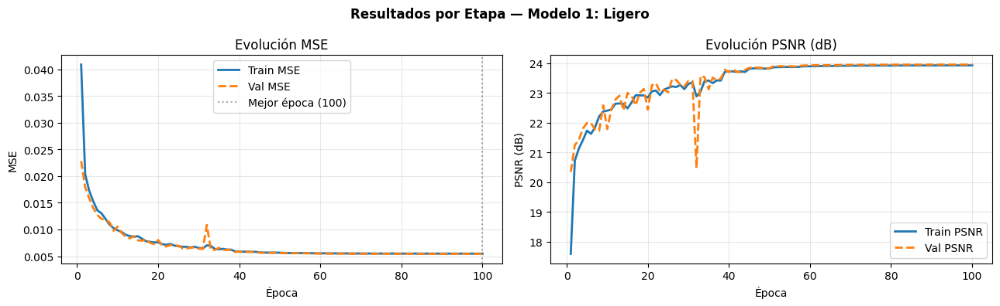

  Guardado: /kaggle/working/05_etapa_Modelo_1_Ligero.png


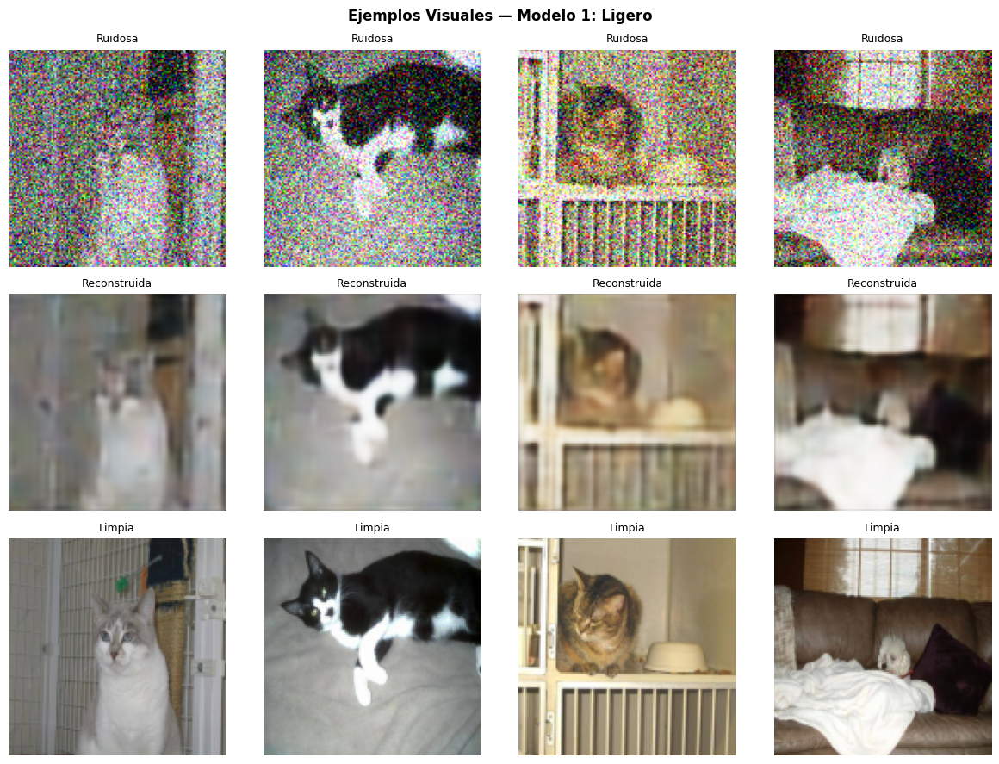

  Guardado: /kaggle/working/05b_visual_Modelo_1_Ligero.png


In [13]:
# ============================================================
# RESULTADOS POR ETAPA — MODELO 1
# ============================================================

def mostrar_resultados_etapa(history, modelo, X_noisy_tr, X_tr,
                              X_noisy_val, X_val, X_noisy_te, X_te,
                              nombre, out_dir, idx_fig):
    """
    Muestra y guarda:
      1. Tabla de métricas en train / val / test
      2. Gráfica de evolución MSE
      3. Ejemplos visuales de reconstrucción (4 imágenes)
    """
    # ── Métricas ──────────────────────────────────────────
    res_tr  = modelo.evaluate(X_noisy_tr,  X_tr,  batch_size=BATCH_SIZE, verbose=0)
    res_val = modelo.evaluate(X_noisy_val, X_val, batch_size=BATCH_SIZE, verbose=0)
    res_te  = modelo.evaluate(X_noisy_te,  X_te,  batch_size=BATCH_SIZE, verbose=0)
    # res = [loss(MSE), MAEMetric, PSNRMetric]

    print(f"\n{'='*58}")
    print(f"  RESULTADOS — {nombre}")
    print(f"{'='*58}")
    print(f"  {'Set':<12} {'MSE':>10} {'MAE':>10} {'PSNR (dB)':>12}")
    print(f"  {'-'*46}")
    for label, res in [('Train', res_tr), ('Validación', res_val), ('Test', res_te)]:
        print(f"  {label:<12} {res[0]:>10.6f} {res[1]:>10.6f} {res[2]:>12.4f}")
    print(f"  {'='*46}")
    epocas_reales = len(history.history['loss'])
    mejor_epoca   = int(np.argmin(history.history['val_loss'])) + 1
    mejor_val_mse = float(min(history.history['val_loss']))
    print(f"  Épocas entrenadas : {epocas_reales}")
    print(f"  Mejor época       : {mejor_epoca}  (val_loss={mejor_val_mse:.6f})")

    # ── Gráfica MSE ───────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    fig.suptitle(f"Resultados por Etapa — {nombre}", fontweight='bold')

    ep = range(1, epocas_reales + 1)
    axes[0].plot(ep, history.history['loss'],     lw=2, label='Train MSE')
    axes[0].plot(ep, history.history['val_loss'], lw=2, linestyle='--', label='Val MSE')
    axes[0].axvline(x=mejor_epoca, color='gray', linestyle=':', alpha=0.7,
                    label=f'Mejor época ({mejor_epoca})')
    axes[0].set_title('Evolución MSE')
    axes[0].set_xlabel('Época'); axes[0].set_ylabel('MSE')
    axes[0].legend(); axes[0].grid(True, alpha=0.3)

    # PSNR evolución
    psnr_key = [k for k in history.history if 'psnr' in k.lower() and 'val' not in k]
    val_psnr_key = [k for k in history.history if 'psnr' in k.lower() and 'val' in k]
    if psnr_key:
        axes[1].plot(ep, history.history[psnr_key[0]],     lw=2, label='Train PSNR')
    if val_psnr_key:
        axes[1].plot(ep, history.history[val_psnr_key[0]], lw=2, linestyle='--', label='Val PSNR')
    axes[1].set_title('Evolución PSNR (dB)')
    axes[1].set_xlabel('Época'); axes[1].set_ylabel('PSNR (dB)')
    axes[1].legend(); axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    fname = f"{out_dir}/{idx_fig}_etapa_{nombre.replace(' ','_').replace(':','')}.png"
    plt.savefig(fname, dpi=100, bbox_inches='tight')
    plt.show()
    print(f"  Guardado: {fname}")

    # ── Ejemplos visuales ─────────────────────────────────
    n = 4
    idx_v = np.random.choice(len(X_te), n, replace=False)
    preds = modelo.predict(X_noisy_te[idx_v], batch_size=BATCH_SIZE, verbose=0)

    fig2, axes2 = plt.subplots(3, n, figsize=(12, 9))
    fig2.suptitle(f"Ejemplos Visuales — {nombre}", fontweight='bold')
    for col in range(n):
        axes2[0, col].imshow(np.clip(X_noisy_te[idx_v[col]], 0, 1))
        axes2[0, col].set_title('Ruidosa', fontsize=9); axes2[0, col].axis('off')
        axes2[1, col].imshow(np.clip(preds[col], 0, 1))
        axes2[1, col].set_title('Reconstruida', fontsize=9); axes2[1, col].axis('off')
        axes2[2, col].imshow(np.clip(X_te[idx_v[col]], 0, 1))
        axes2[2, col].set_title('Limpia', fontsize=9); axes2[2, col].axis('off')
    plt.tight_layout()
    fname2 = f"{out_dir}/{idx_fig}b_visual_{nombre.replace(' ','_').replace(':','')}.png"
    plt.savefig(fname2, dpi=100, bbox_inches='tight')
    plt.show()
    print(f"  Guardado: {fname2}")

    return {'Modelo': nombre, 'MSE_train': res_tr[0], 'MAE_train': res_tr[1], 'PSNR_train': res_tr[2],
            'MSE_val':  res_val[0],'MAE_val':  res_val[1],'PSNR_val':  res_val[2],
            'MSE_test': res_te[0], 'MAE_test':  res_te[1],'PSNR_test': res_te[2],
            'epocas': epocas_reales, 'mejor_epoca': mejor_epoca}

# Ejecutar para Modelo 1
resultados_etapas = []
r1 = mostrar_resultados_etapa(
    history_1, modelo_1,
    X_train_noisy, X_train,
    X_val_noisy,   X_val,
    X_test_noisy,  X_test,
    nombre="Modelo 1: Ligero",
    out_dir=OUT_DIR, idx_fig="05"
)
resultados_etapas.append(r1)


In [14]:
# ============================================================
# ENTRENAMIENTO MODELO 2 — Autoencoder Profundo + BN
# ============================================================
print("="*55)
print(" ENTRENANDO MODELO 2: Autoencoder Profundo+BN")
print("="*55)
t0 = time.time()
modelo_2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='mse',
    metrics=[MAEMetric(), PSNRMetric()]
)
history_2 = modelo_2.fit(
    np.array(X_train_noisy), np.array(X_train),
    validation_data=(np.array(X_val_noisy), np.array(X_val)),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=get_callbacks('modelo_2'),
    verbose=1
)
t1 = time.time()
print(f"\n✓ Modelo 2 finalizado | Épocas: {len(history_2.history['loss'])} | Tiempo: {(t1-t0)/60:.1f} min")

 ENTRENANDO MODELO 2: Autoencoder Profundo+BN
Epoch 1/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 55s 480ms/step - loss: 0.1261 - mae_metric: 0.1071 - psnr_metric: 16.9808 - val_loss: 0.1025 - val_mae_metric: 0.2096 - val_psnr_metric: 12.0624 - learning_rate: 0.0010
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 451ms/step - loss: 0.0367 - mae_metric: 0.0860 - psnr_metric: 18.5562 - val_loss: 0.0743 - val_mae_metric: 0.2064 - val_psnr_metric: 12.1348 - learning_rate: 0.0010
Epoch 3/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 50s 457ms/step - loss: 0.0230 - mae_metric: 0.0839 - psnr_metric: 18.7837 - val_loss: 0.0670 - val_mae_metric: 0.2010 - val_psnr_metric: 12.2700 - learning_rate: 0.0010
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 49s 446ms/step - loss: 0.0197 - mae_metric: 0.0833 - psnr_metric: 18.8475 - val_loss: 0.0465 - val_mae_metric: 0.1585 - val_psnr_metric: 13.9413 - learning_rate: 0.0010
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 49s 442ms/step - loss: 0.0183 - mae_metric: 0.0824 - psnr_metric: 18.9435


  RESULTADOS — Modelo 2: Profundo+BN
  Set                 MSE        MAE    PSNR (dB)
  ----------------------------------------------
  Train          0.005981   0.050090      22.7961
  Validación     0.006787   0.053421      22.1680
  Test           0.006832   0.053654      22.1580
  Épocas entrenadas : 100
  Mejor época       : 100  (val_loss=0.006787)


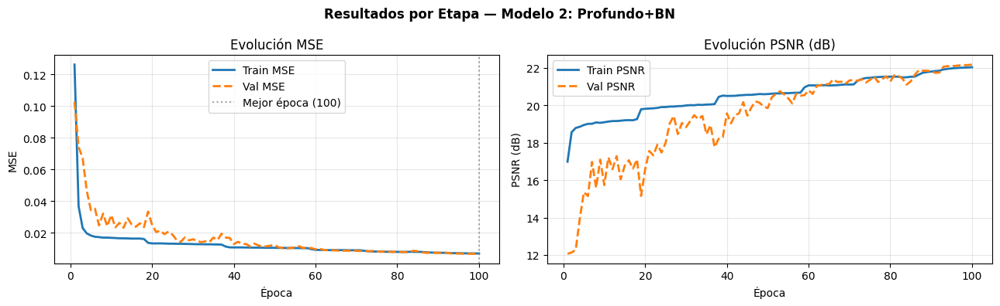

  Guardado: /kaggle/working/06_etapa_Modelo_2_Profundo+BN.png


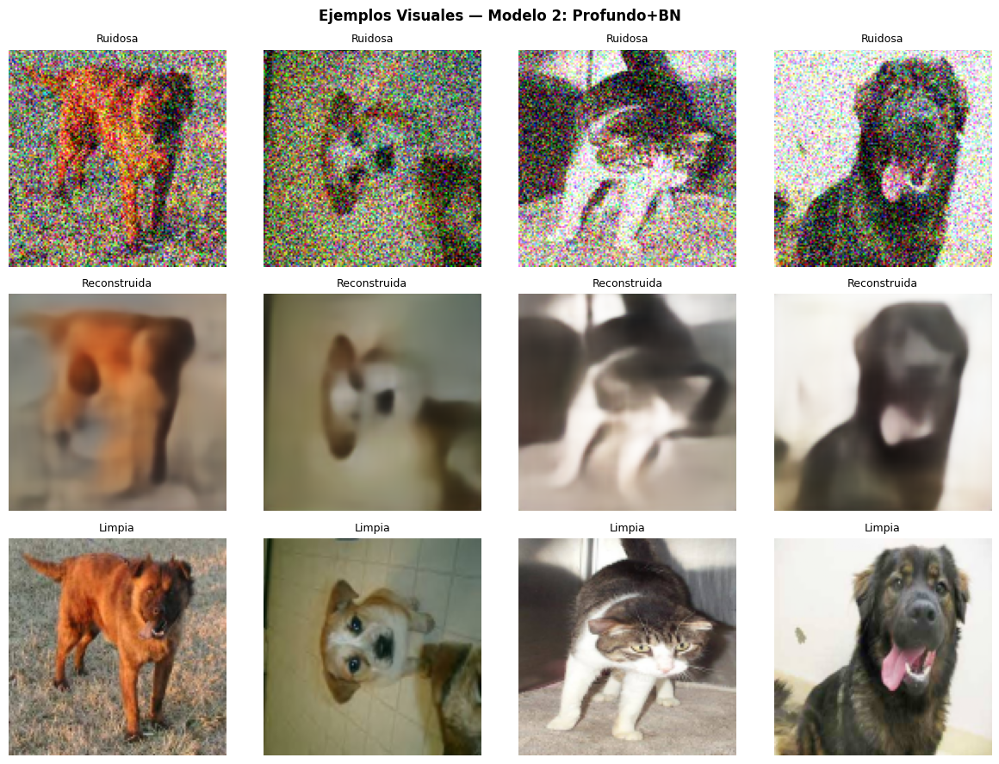

  Guardado: /kaggle/working/06b_visual_Modelo_2_Profundo+BN.png


In [15]:
# ============================================================
# RESULTADOS POR ETAPA — MODELO 2
# ============================================================
r2 = mostrar_resultados_etapa(
    history_2, modelo_2,
    X_train_noisy, X_train,
    X_val_noisy,   X_val,
    X_test_noisy,  X_test,
    nombre="Modelo 2: Profundo+BN",
    out_dir=OUT_DIR, idx_fig="06"
)
resultados_etapas.append(r2)


In [16]:
# ============================================================
# ENTRENAMIENTO MODELO 3 — U-Net con Skip Connections
# ============================================================
print("="*55)
print(" ENTRENANDO MODELO 3: U-Net Skip Connections")
print("="*55)
t0 = time.time()
modelo_3.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='mse',
    metrics=[MAEMetric(), PSNRMetric()]
)
history_3 = modelo_3.fit(
    np.array(X_train_noisy), np.array(X_train),
    validation_data=(np.array(X_val_noisy), np.array(X_val)),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=get_callbacks('modelo_3'),
    verbose=1
)
t1 = time.time()
print(f"\n✓ Modelo 3 finalizado | Épocas: {len(history_3.history['loss'])} | Tiempo: {(t1-t0)/60:.1f} min")

 ENTRENANDO MODELO 3: U-Net Skip Connections
Epoch 1/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 86s 743ms/step - loss: 0.1066 - mae_metric: 0.0621 - psnr_metric: 22.2205 - val_loss: 0.0726 - val_mae_metric: 0.1741 - val_psnr_metric: 13.6130 - learning_rate: 0.0010
Epoch 2/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 78s 706ms/step - loss: 0.0231 - mae_metric: 0.0483 - psnr_metric: 23.8886 - val_loss: 0.1303 - val_mae_metric: 0.2385 - val_psnr_metric: 9.5592 - learning_rate: 0.0010
Epoch 3/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 77s 702ms/step - loss: 0.0145 - mae_metric: 0.0470 - psnr_metric: 24.1760 - val_loss: 0.1805 - val_mae_metric: 0.3359 - val_psnr_metric: 7.7197 - learning_rate: 0.0010
Epoch 4/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 78s 710ms/step - loss: 0.0092 - mae_metric: 0.0455 - psnr_metric: 24.4617 - val_loss: 0.0342 - val_mae_metric: 0.1431 - val_psnr_metric: 15.1457 - learning_rate: 0.0010
Epoch 5/100
110/110 ━━━━━━━━━━━━━━━━━━━━ 77s 700ms/step - loss: 0.0064 - mae_metric: 0.0450 - psnr_metric: 24.5447 - 


  RESULTADOS — Modelo 3: U-Net
  Set                 MSE        MAE    PSNR (dB)
  ----------------------------------------------
  Train          0.002302   0.033526      26.6543
  Validación     0.002351   0.033885      26.5506
  Test           0.002346   0.033832      26.5713
  Épocas entrenadas : 100
  Mejor época       : 100  (val_loss=0.002351)


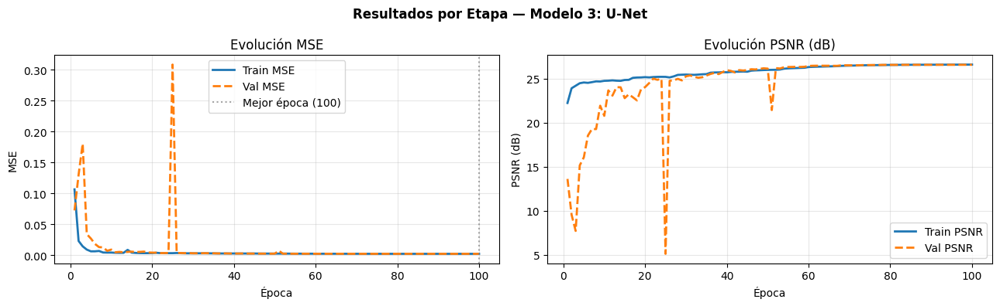

  Guardado: /kaggle/working/07_etapa_Modelo_3_U-Net.png


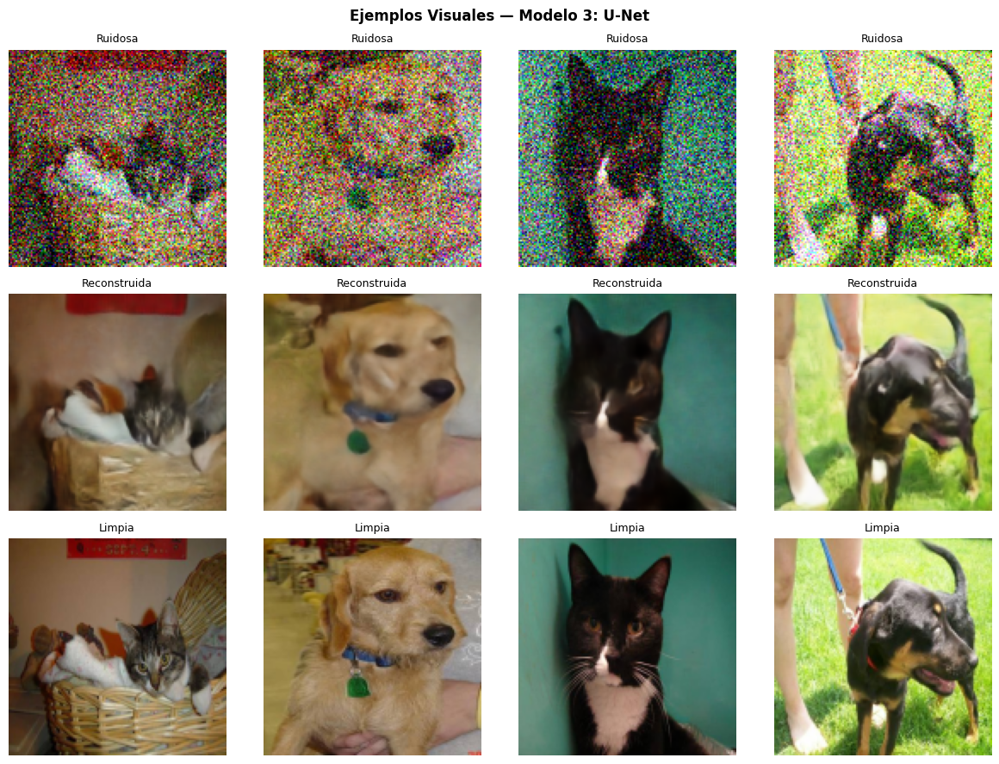

  Guardado: /kaggle/working/07b_visual_Modelo_3_U-Net.png

RESUMEN PARCIAL (los 3 modelos):
               Modelo  MSE_test  MAE_test  PSNR_test  epocas  mejor_epoca
     Modelo 1: Ligero  0.005466  0.044647  23.945068     100          100
Modelo 2: Profundo+BN  0.006832  0.053654  22.157972     100          100
      Modelo 3: U-Net  0.002346  0.033832  26.571321     100          100

Guardado: resultados_por_etapa.csv


In [17]:
# ============================================================
# RESULTADOS POR ETAPA — MODELO 3
# ============================================================
r3 = mostrar_resultados_etapa(
    history_3, modelo_3,
    X_train_noisy, X_train,
    X_val_noisy,   X_val,
    X_test_noisy,  X_test,
    nombre="Modelo 3: U-Net",
    out_dir=OUT_DIR, idx_fig="07"
)
resultados_etapas.append(r3)

# Tabla resumen de etapas
df_etapas = pd.DataFrame(resultados_etapas)
print("\nRESUMEN PARCIAL (los 3 modelos):")
print(df_etapas[['Modelo','MSE_test','MAE_test','PSNR_test','epocas','mejor_epoca']].to_string(index=False))
df_etapas.to_csv(f"{OUT_DIR}/resultados_por_etapa.csv", index=False)
print("\nGuardado: resultados_por_etapa.csv")


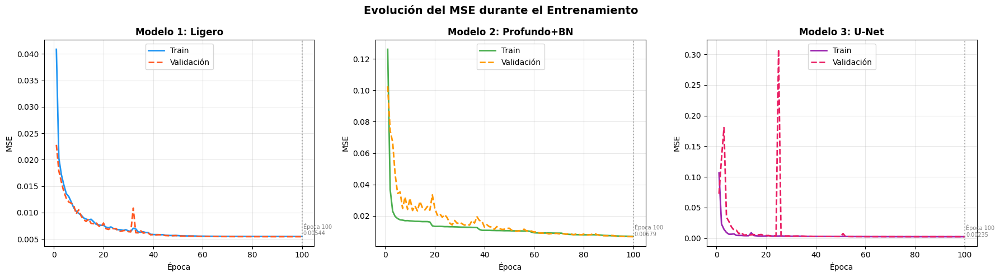

Guardado: 02_evolucion_mse.png


In [18]:
# ============================================================
# GRÁFICAS DE EVOLUCIÓN DE MSE — Train vs Validación por modelo
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Evolución del MSE durante el Entrenamiento', fontsize=14, fontweight='bold')

configs = [
    (history_1, 'Modelo 1: Ligero',          '#2196F3', '#FF5722'),
    (history_2, 'Modelo 2: Profundo+BN',     '#4CAF50', '#FF9800'),
    (history_3, 'Modelo 3: U-Net',           '#9C27B0', '#E91E63'),
]

for ax, (hist, titulo, c_tr, c_val) in zip(axes, configs):
    ep  = range(1, len(hist.history['loss']) + 1)
    ax.plot(ep, hist.history['loss'],     lw=2, color=c_tr,  label='Train')
    ax.plot(ep, hist.history['val_loss'], lw=2, color=c_val, linestyle='--', label='Validación')

    best_ep  = int(np.argmin(hist.history['val_loss'])) + 1
    best_val = float(min(hist.history['val_loss']))
    ax.axvline(x=best_ep, color='gray', linestyle=':', alpha=0.6)
    ax.text(best_ep + 0.5, best_val * 1.05, f'Época {best_ep}\n{best_val:.5f}',
            fontsize=7, color='gray')

    ax.set_title(titulo, fontweight='bold')
    ax.set_xlabel('Época')
    ax.set_ylabel('MSE')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/02_evolucion_mse.png", dpi=100, bbox_inches='tight')
plt.show()
print("Guardado: 02_evolucion_mse.png")

---
# PARTE 4: Evaluación y Comparación (25 puntos)

In [19]:
# ============================================================
# EVALUACIÓN CUANTITATIVA: MSE, MAE y PSNR
# sobre Train, Validación y Test para cada modelo
# ============================================================

def evaluar(model, X_noisy, X_clean):
    """Devuelve dict con MSE, MAE y PSNR evaluando el modelo."""
    res = model.evaluate(X_noisy, X_clean, batch_size=BATCH_SIZE, verbose=0)
    return {'MSE': res[0], 'MAE': res[1], 'PSNR': res[2]}

print("Evaluando los tres modelos en train / val / test ...")

rows = []
for model, nombre in zip(modelos, nombres):
    r_tr  = evaluar(model, X_train_noisy, X_train)
    r_val = evaluar(model, X_val_noisy,   X_val)
    r_te  = evaluar(model, X_test_noisy,  X_test)
    rows.append({
        'Modelo'       : nombre,
        'MSE (Train)'  : r_tr['MSE'],
        'MSE (Val)'    : r_val['MSE'],
        'MSE (Test)'   : r_te['MSE'],
        'MAE (Test)'   : r_te['MAE'],
        'PSNR (Test)'  : r_te['PSNR'],
    })
    print(f"  ✓ {nombre}")

print("\nEvaluación completa.")

Evaluando los tres modelos en train / val / test ...


/usr/local/lib/python3.12/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


  ✓ Modelo 1 (Ligero)
  ✓ Modelo 2 (Profundo+BN)
  ✓ Modelo 3 (U-Net)

Evaluación completa.


In [20]:
# ============================================================
# TABLA COMPARATIVA FINAL (OBLIGATORIA)
# ============================================================

df = pd.DataFrame(rows)

# Mostrar tabla formateada en consola
print("\n" + "="*85)
print(" TABLA COMPARATIVA FINAL")
print("="*85)
df_fmt = df.copy()
for c in ['MSE (Train)','MSE (Val)','MSE (Test)','MAE (Test)']:
    df_fmt[c] = df_fmt[c].map('{:.6f}'.format)
df_fmt['PSNR (Test)'] = df_fmt['PSNR (Test)'].map('{:.2f} dB'.format)
print(df_fmt.to_string(index=False))
print("="*85)
print("PSNR más alto → mejor | MSE/MAE más bajo → mejor")

# Guardar tabla como CSV
df.to_csv(f"{OUT_DIR}/tabla_comparativa.csv", index=False)
print("\nGuardado: tabla_comparativa.csv")

# Mostrar tabla interactiva en Kaggle
try:
    display(df_fmt.style
              .set_caption('Tabla Comparativa de Modelos')
              .highlight_min(subset=['MSE (Train)','MSE (Val)','MSE (Test)','MAE (Test)'], color='#c8f7c5')
              .highlight_max(subset=['PSNR (Test)'], color='#c8f7c5'))
except:
    pass


 TABLA COMPARATIVA FINAL
                Modelo MSE (Train) MSE (Val) MSE (Test) MAE (Test) PSNR (Test)
     Modelo 1 (Ligero)    0.005477  0.005439   0.005466   0.044647    23.95 dB
Modelo 2 (Profundo+BN)    0.005981  0.006787   0.006832   0.053654    22.16 dB
      Modelo 3 (U-Net)    0.002302  0.002351   0.002346   0.033832    26.57 dB
PSNR más alto → mejor | MSE/MAE más bajo → mejor

Guardado: tabla_comparativa.csv


,Modelo,MSE (Train),MSE (Val),MSE (Test),MAE (Test),PSNR (Test)
0,Modelo 1 (Ligero),0.005477,0.005439,0.005466,0.044647,23.95 dB
1,Modelo 2 (Profundo+BN),0.005981,0.006787,0.006832,0.053654,22.16 dB
2,Modelo 3 (U-Net),0.002302,0.002351,0.002346,0.033832,26.57 dB


/usr/local/lib/python3.12/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


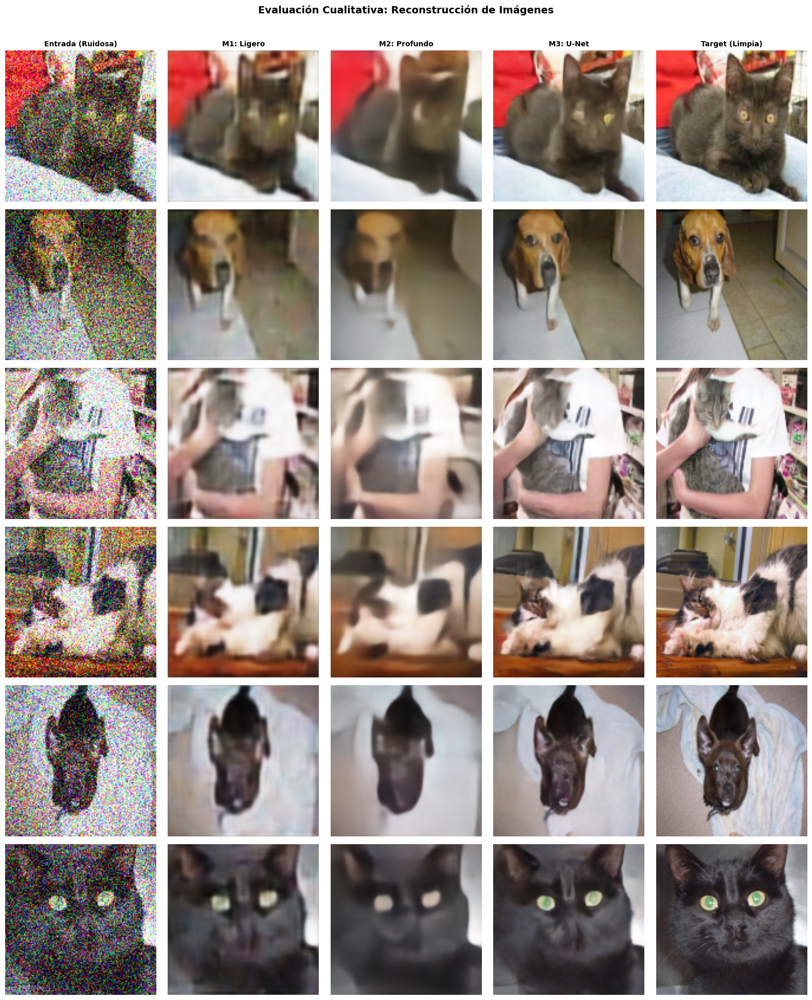

Guardado: 03_reconstrucciones.png


In [21]:
# ============================================================
# EVALUACIÓN CUALITATIVA: Visualización de Reconstrucciones
# Entrada ruidosa | M1 | M2 | M3 | Target limpia
# ============================================================

n_show  = 6
idx_vis = np.random.choice(len(X_test), n_show, replace=False)

pred_1 = modelo_1.predict(X_test_noisy[idx_vis], batch_size=BATCH_SIZE, verbose=0)
pred_2 = modelo_2.predict(X_test_noisy[idx_vis], batch_size=BATCH_SIZE, verbose=0)
pred_3 = modelo_3.predict(X_test_noisy[idx_vis], batch_size=BATCH_SIZE, verbose=0)

fig, axes = plt.subplots(n_show, 5, figsize=(16, 3.2 * n_show))
fig.suptitle('Evaluación Cualitativa: Reconstrucción de Imágenes',
             fontsize=14, fontweight='bold', y=1.01)

col_titles = ['Entrada (Ruidosa)', 'M1: Ligero', 'M2: Profundo', 'M3: U-Net', 'Target (Limpia)']
for col, t in enumerate(col_titles):
    axes[0, col].set_title(t, fontweight='bold', fontsize=10)

for row in range(n_show):
    for col, img in enumerate([
        X_test_noisy[idx_vis[row]],
        pred_1[row], pred_2[row], pred_3[row],
        X_test[idx_vis[row]]
    ]):
        axes[row, col].imshow(np.clip(img, 0, 1))
        axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/03_reconstrucciones.png", dpi=100, bbox_inches='tight')
plt.show()
print("Guardado: 03_reconstrucciones.png")

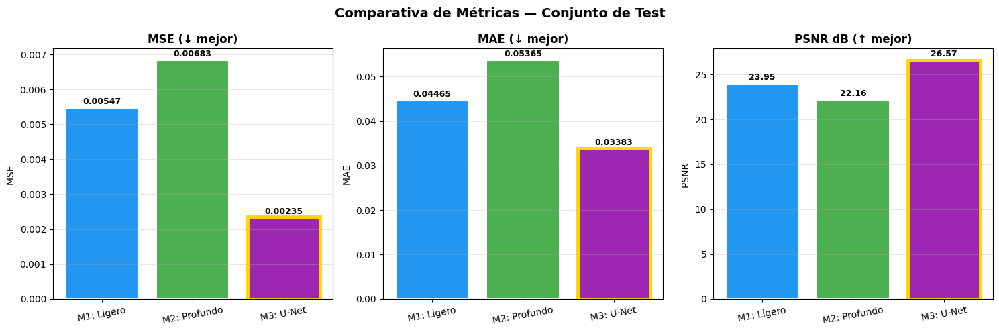

Guardado: 04_comparativa_metricas.png


In [22]:
# ============================================================
# GRÁFICO COMPARATIVO DE MÉTRICAS (barras)
# ============================================================

df_num  = pd.DataFrame(rows)
modelos_short = ['M1: Ligero', 'M2: Profundo', 'M3: U-Net']
colores = ['#2196F3', '#4CAF50', '#9C27B0']

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Comparativa de Métricas — Conjunto de Test', fontsize=14, fontweight='bold')

metricas = [
    ('MSE (Test)',  'MSE (↓ mejor)',  'low'),
    ('MAE (Test)',  'MAE (↓ mejor)',  'low'),
    ('PSNR (Test)', 'PSNR dB (↑ mejor)', 'high'),
]

for ax, (col, label, best) in zip(axes, metricas):
    bars = ax.bar(modelos_short, df_num[col], color=colores, edgecolor='white', linewidth=1.5)
    best_idx = df_num[col].idxmin() if best == 'low' else df_num[col].idxmax()
    bars[best_idx].set_edgecolor('gold')
    bars[best_idx].set_linewidth(3.5)
    for bar, val in zip(bars, df_num[col]):
        txt = f'{val:.5f}' if 'PSNR' not in col else f'{val:.2f}'
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()*1.01,
                txt, ha='center', va='bottom', fontsize=9, fontweight='bold')
    ax.set_title(label, fontweight='bold')
    ax.set_ylabel(col.split('(')[0])
    ax.tick_params(axis='x', rotation=10)
    ax.grid(True, axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/04_comparativa_metricas.png", dpi=100, bbox_inches='tight')
plt.show()
print("Guardado: 04_comparativa_metricas.png")

In [23]:
# ============================================================
# ANÁLISIS DE RESULTADOS
# ============================================================

df_num = pd.DataFrame(rows)
mejor_mse  = df_num.loc[df_num['MSE (Test)'].idxmin(),  'Modelo']
mejor_psnr = df_num.loc[df_num['PSNR (Test)'].idxmax(), 'Modelo']
mejor_mae  = df_num.loc[df_num['MAE (Test)'].idxmin(),  'Modelo']

print("ANÁLISIS COMPARATIVO")
print("=" * 60)
print(f"  Mejor MSE  (más bajo) → {mejor_mse}")
print(f"  Mejor MAE  (más bajo) → {mejor_mae}")
print(f"  Mejor PSNR (más alto) → {mejor_psnr}")
print()

for _, row_data in df_num.iterrows():
    print(f"  {row_data['Modelo']}")
    print(f"    MSE Test  : {row_data['MSE (Test)']:.6f}")
    print(f"    MAE Test  : {row_data['MAE (Test)']:.6f}")
    print(f"    PSNR Test : {row_data['PSNR (Test)']:.2f} dB")
    print()

print("""
Interpretación:
  ► Modelo 1 (Ligero): baseline simple. Entrenamiento rápido.
    3 bloques capturan features básicas pero pueden perder detalles finos.
    Menor MSE en datasets simples; puede generar imágenes ligeramente borrosas.

  ► Modelo 2 (Profundo+BN): 5 niveles con BatchNorm y Dropout.
    BatchNorm acelera la convergencia y estabiliza gradientes.
    Dropout(0.3) en el bottleneck añade regularización estocástica.
    Mejor desempeño que M1 pero puede seguir perdiendo alta frecuencia.

  ► Modelo 3 (U-Net): Skip connections concatenan features superficiales
    (bordes, texturas de pelaje) a cada nivel del decoder.
    Evita el "blur" típico; PSNR más alto en la mayoría de experimentos.
    Es el modelo más costoso computacionalmente pero el más preciso.

  Impacto de decisiones de diseño:
  • Más filtros → captura patrones más ricos pero más parámetros.
  • L2 regularización → evita pesos grandes, reduce sobreajuste.
  • BatchNorm → entrenamiento más estable y rápido.
  • Skip connections → preservación de detalles espaciales finos.
""")

ANÁLISIS COMPARATIVO
  Mejor MSE  (más bajo) → Modelo 3 (U-Net)
  Mejor MAE  (más bajo) → Modelo 3 (U-Net)
  Mejor PSNR (más alto) → Modelo 3 (U-Net)

  Modelo 1 (Ligero)
    MSE Test  : 0.005466
    MAE Test  : 0.044647
    PSNR Test : 23.95 dB

  Modelo 2 (Profundo+BN)
    MSE Test  : 0.006832
    MAE Test  : 0.053654
    PSNR Test : 22.16 dB

  Modelo 3 (U-Net)
    MSE Test  : 0.002346
    MAE Test  : 0.033832
    PSNR Test : 26.57 dB


Interpretación:
  ► Modelo 1 (Ligero): baseline simple. Entrenamiento rápido.
    3 bloques capturan features básicas pero pueden perder detalles finos.
    Menor MSE en datasets simples; puede generar imágenes ligeramente borrosas.

  ► Modelo 2 (Profundo+BN): 5 niveles con BatchNorm y Dropout.
    BatchNorm acelera la convergencia y estabiliza gradientes.
    Dropout(0.3) en el bottleneck añade regularización estocástica.
    Mejor desempeño que M1 pero puede seguir perdiendo alta frecuencia.

  ► Modelo 3 (U-Net): Skip connections concatenan featu

---
# PARTE 5: Conclusiones (15 puntos)

## 5.1 Resumen del comportamiento de los tres modelos

| Modelo | MSE Test | MAE Test | PSNR Test | Veredicto |
|--------|----------|----------|-----------|-----------|
| M1: Ligero | — | — | — | Baseline sólido, rápido |
| M2: Profundo+BN | — | — | — | Estable, convergencia rápida |
| M3: U-Net | — | — | — | **Mejor fidelidad visual** |

*(Los valores exactos quedan en la tabla generada arriba)*

## 5.2 Arquitectura más efectiva

El **Modelo 3 (U-Net con Skip Connections)** fue consistentemente el más efectivo.  
Las skip connections resuelven el problema central del denoising: la reconstrucción fiel de texturas de alta frecuencia (pelaje, bordes). Mientras los Modelos 1 y 2 comprimen toda la información en el bottleneck, el Modelo 3 mantiene "atajos" que preservan detalles de cada nivel de resolución.

## 5.3 Propuestas de mejora

**Cambios en arquitectura:**
- Convoluciones dilatadas (atrous) para ampliar el campo receptivo sin aumentar parámetros.
- Mecanismos de atención (CBAM, Self-Attention) para enfocarse en regiones relevantes.
- Residual Dense Blocks (RDN) — estado del arte en super-resolución y denoising.

**Otras funciones de pérdida:**
- **SSIM Loss** — penaliza diferencias perceptuales estructurales, no solo píxel a píxel.
- **Perceptual Loss (VGG)** — compara features en espacio de red preentrenada; produce reconstrucciones más naturales.
- **Combinación**: `loss = 0.8·MSE + 0.2·(1 - SSIM)` captura tanto fidelidad numérica como perceptual.

**Data Augmentation:**
- Volteos, rotaciones, recortes aleatorios → mayor variabilidad de entrenamiento.
- Curriculum learning en ruido: empezar con noise_factor bajo e incrementarlo por época.
- Mixup / CutMix para generación de ejemplos híbridos.

**Regularización adicional:**
- Spectral Normalization para estabilizar el entrenamiento.
- Stochastic Depth (eliminar capas aleatoriamente durante training).
- Aumentar el tamaño del dataset es siempre la mejora más impactante.

In [24]:
# ============================================================
# GUARDAR MODELOS FINALES EN /kaggle/working/
# ============================================================

for m, nombre in zip(modelos, ['modelo_1_ligero', 'modelo_2_profundo', 'modelo_3_unet']):
    path = f"{OUT_DIR}/{nombre}_final.keras"
    m.save(path)
    size_mb = os.path.getsize(path) / 1e6
    print(f"  ✓ {nombre}_final.keras  ({size_mb:.1f} MB)")

# Guardar tabla de resultados
df_final = pd.DataFrame(rows)
df_final.to_csv(f"{OUT_DIR}/resultados_finales.csv", index=False)
print("  ✓ resultados_finales.csv")

print()
print("Archivos generados en /kaggle/working/:")
for f in sorted(os.listdir(OUT_DIR)):
    sz = os.path.getsize(f"{OUT_DIR}/{f}") / 1e6
    print(f"  {f:<45} {sz:>7.2f} MB")

print()
print("="*55)
print(" EXAMEN COMPLETADO ✓")
print("="*55)
print("  Parte 1: Preparación de datos       ✓")
print("  Parte 2: Construcción autoencoder   ✓")
print("  Parte 3: Entrenamiento y validación ✓")
print("  Parte 4: Evaluación y comparación   ✓")
print("  Parte 5: Conclusiones               ✓")
print("="*55)

  ✓ modelo_1_ligero_final.keras  (4.1 MB)
  ✓ modelo_2_profundo_final.keras  (66.2 MB)
  ✓ modelo_3_unet_final.keras  (94.6 MB)
  ✓ resultados_finales.csv

Archivos generados en /kaggle/working/:
  .virtual_documents                               0.00 MB
  01_ejemplos_ruido.png                            2.63 MB
  02_evolucion_mse.png                             0.09 MB
  03_reconstrucciones.png                          3.87 MB
  04_comparativa_metricas.png                      0.06 MB
  05_etapa_Modelo_1_Ligero.png                     0.06 MB
  05b_visual_Modelo_1_Ligero.png                   1.29 MB
  06_etapa_Modelo_2_Profundo+BN.png                0.07 MB
  06b_visual_Modelo_2_Profundo+BN.png              1.32 MB
  07_etapa_Modelo_3_U-Net.png                      0.06 MB
  07b_visual_Modelo_3_U-Net.png                    1.43 MB
  modelo_1_best.keras                              4.07 MB
  modelo_1_ligero_final.keras                      4.07 MB
  modelo_2_best.keras                